## EDA and SVM

In [145]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
import matplotlib, datetime
import seaborn as sns
import statistics


from sklearn.model_selection import train_test_split
from sklearn import svm, preprocessing
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, OneHotEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_rows = 500

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline


In [146]:
data = pd.read_csv('bt4240Dataset2.csv').rename(columns = {'Unnamed: 0':'index1'})
# traindf= pd.read_csv('traindf.csv')

## Create dataset -- Undersampling

In [147]:
# fullvisitorid with transactions
sample = data[['fullVisitorId','transactions']]
sample1 = sample.groupby(by='fullVisitorId',as_index=False).count()
# sample1 = sample1[sample1['transactions'].isnull() == False]

In [148]:
distFullVisitorId = data[['fullVisitorId','transactions']].groupby(by='fullVisitorId',as_index= False).count()
trans = distFullVisitorId[distFullVisitorId['transactions']>0]
nontrans = distFullVisitorId[distFullVisitorId['transactions']==0]
nontransUnderSample = nontrans.sample(n=len(trans.index),random_state=10,replace = True)
print('fullVisitorId with trans = '+ str(len(trans.index)))
print('fullVisitorId with undersampleed non-trans = '+ str(len(nontransUnderSample.index)))
transSample = data[data['fullVisitorId'].isin( (trans['fullVisitorId'].values.tolist()))]
transSample['label'] = 1
nonTransSample =data[data['fullVisitorId'].isin( (nontransUnderSample['fullVisitorId'].values.tolist()))]
nonTransSample['label']=0
maindf = pd.concat([transSample,nonTransSample])
print('Pageviews with transaction -->' + str(transSample.shape))
print('Pageviews without transaction -->' + str(nonTransSample.shape))
print('All pageviews -->' + str(maindf.shape))

def convertToString(x):
    if isinstance(x,int):
        return str(x)
    else: return x
maindf['fullVisitorId'] = maindf['fullVisitorId'].apply(convertToString)

fullVisitorId with trans = 11238
fullVisitorId with undersampleed non-trans = 11238
Pageviews with transaction -->(676475, 50)
Pageviews without transaction -->(52514, 50)
All pageviews -->(728989, 50)


In [149]:
# maindf.to_csv('maindf.csv')

In [ ]:
# maindf = pd.read_csv('maindf.csv')
# def convertToString(x):
#     if isinstance(x,int):
#         return str(x)
#     else: return x
# maindf['fullVisitorId'] = maindf['fullVisitorId'].apply(convertToString)
# # maindf=maindf1

## Aggregating Data

In [ ]:
print(sorted(maindf.columns))

['Hit_transaction', 'action_type', 'affiliation', 'campaign', 'channelGrouping', 'continent', 'country', 'currencyCode', 'date', 'fullVisitorId', 'hasSocialSourceReferral', 'hitNumber', 'hits', 'index1', 'isEntrance', 'isExit', 'isInteraction', 'isMobile', 'keyword', 'label', 'localTransactionRevenue', 'localTransactionShipping', 'localTransactionTax', 'medium', 'operatingSystem', 'pagePath', 'pagePathLevel1', 'pagePathLevel2', 'pagePathLevel3', 'pagePathLevel4', 'pageviews', 'referralPath', 'searchCategory', 'searchKeyword', 'sessionQualityDim', 'socialInteractionNetworkAction', 'socialNetwork', 'source', 'step', 'subContinent', 'timeOnSite', 'total_TranscationRevenue', 'total_totalTransactionRevenue', 'transactionCoupon', 'transactionId', 'transactionRevenue', 'transactionShipping', 'transactionTax', 'transactions', 'visitStartTime']


In [ ]:
excludeRevenue = ['Hit_transaction', 'total_TranscationRevenue', 'total_totalTransactionRevenue', 
           'transactionRevenue', 'transactionTax', 'localTransactionRevenue', 
           'localTransactionTax', 'total_TranscationRevenue', 
           'total_totalTransactionRevenue', 'transactionRevenue', 'localTransactionRevenue']
tempDrop = ['pagePath', 'pagePathLevel1', 
           'pagePathLevel2', 'pagePathLevel3', 'pagePathLevel4']
dropCol = tempDrop + excludeRevenue

maindf = maindf.drop(columns = dropCol)

In [ ]:
continuous = list(maindf.describe().columns)
refCol = ['index1','visitStartTime','date','fullVisitorId']
discrete = list(set(list(maindf.columns)) - set(continuous))
continuous = list(set(continuous) - set(refCol)) + refCol
discrete = list(set(discrete)-set(refCol)) + refCol

## Investigating Discrete columns

In [ ]:
# tempCol = ['index1','visitStartTime','date','fullVisitorId','isMobile','label']
# groupbyCol = ['fullVisitorId','date','visitStartTime','label','isMobile']
# x = maindf[tempCol].groupby(by=groupbyCol,as_index=False).count()
# x = x.groupby(by=['fullVisitorId','label','isMobile'],as_index= False).count()
# x = x.groupby(by=['isMobile','label'],as_index=False).count()
# x

In [ ]:
discrete

['campaign',
 'source',
 'operatingSystem',
 'currencyCode',
 'socialNetwork',
 'medium',
 'subContinent',
 'affiliation',
 'transactionId',
 'searchCategory',
 'channelGrouping',
 'continent',
 'isExit',
 'transactionCoupon',
 'isEntrance',
 'referralPath',
 'country',
 'socialInteractionNetworkAction',
 'isInteraction',
 'hasSocialSourceReferral',
 'searchKeyword',
 'isMobile',
 'keyword',
 'index1',
 'visitStartTime',
 'date',
 'fullVisitorId']

affiliation


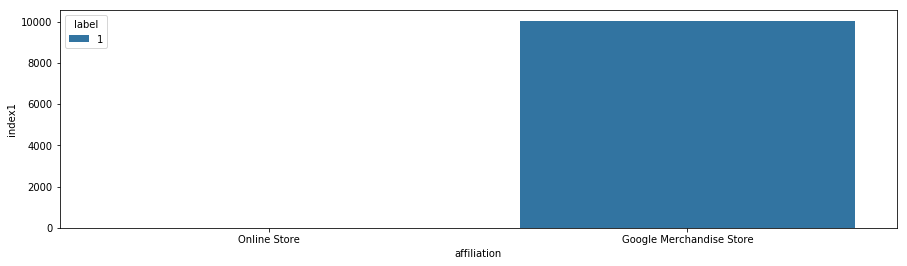

campaign


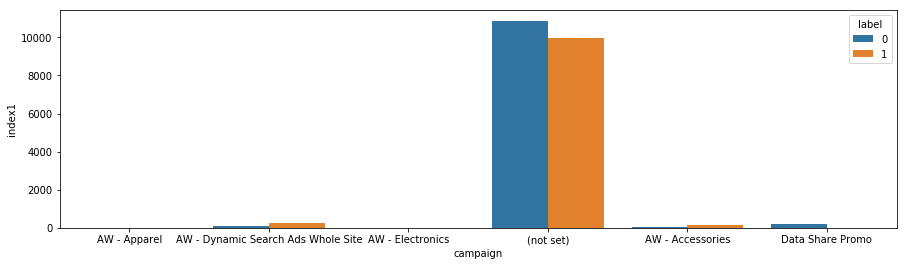

channelGrouping


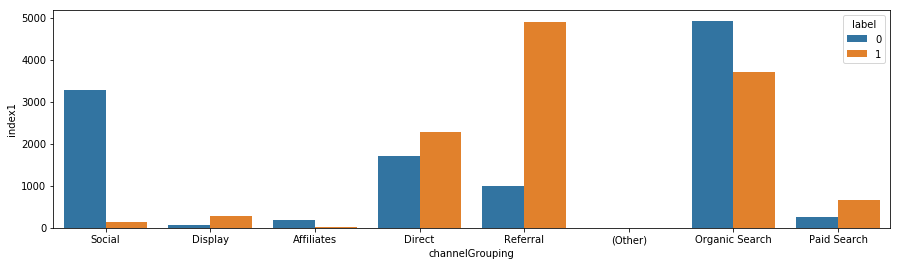

continent


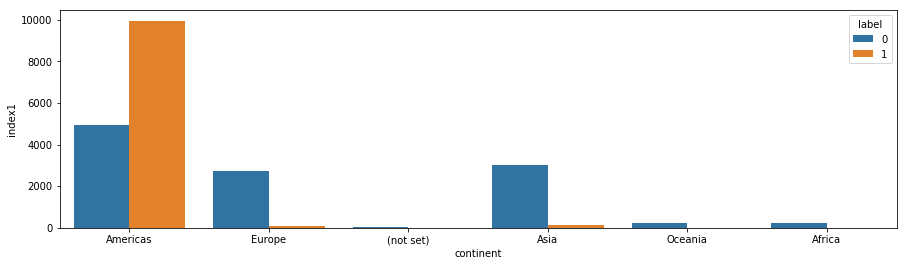

country


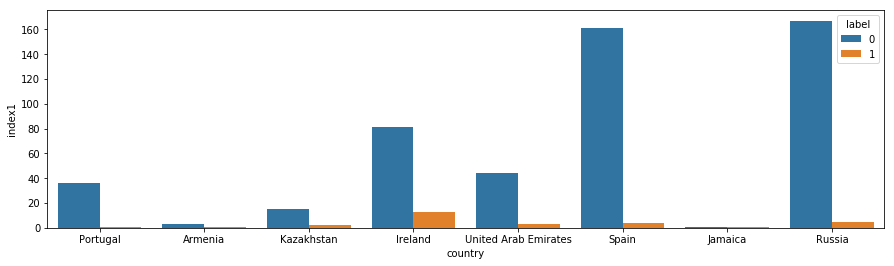

currencyCode


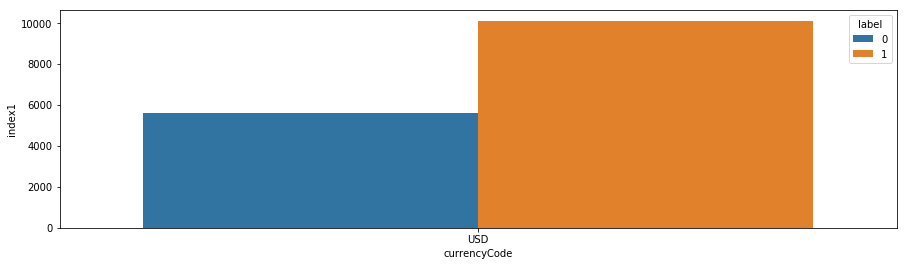

hasSocialSourceReferral


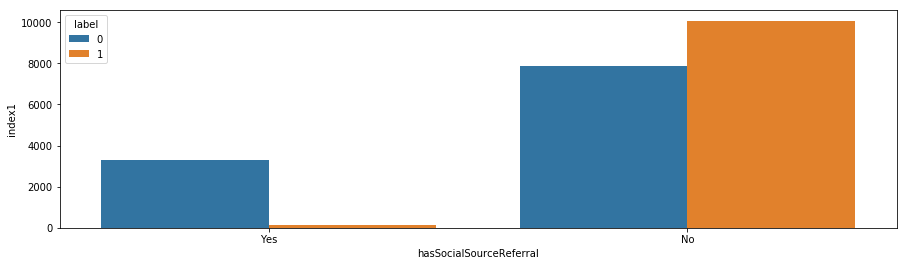

isEntrance


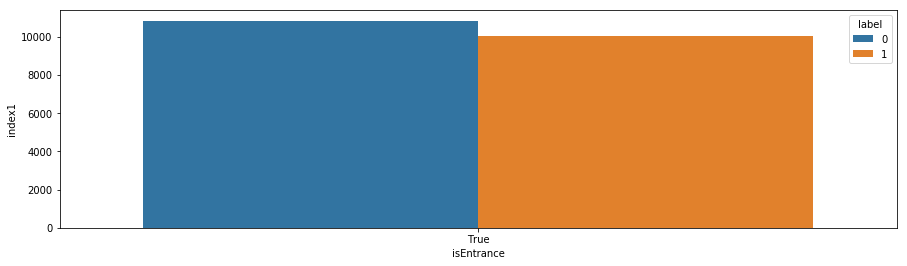

isExit


In [ ]:
#Visualizing Discrete Var with < 20 unique values
refCol = ['index1','visitStartTime','date','fullVisitorId']

count =0
notdisplayed = []
for col in sorted(discrete):
#     if count >10: break
    excludeCol = ['date','fullVisitorId','index1','transactionCoupon','transactionId','referralPath','visitStartTime']
    if col in excludeCol:
        continue
    print(col)
    tempCol = ['index1','visitStartTime','date','fullVisitorId',col,'label']
    groupbyCol = ['fullVisitorId','date','visitStartTime','label',col]
    x = maindf[tempCol].groupby(by=groupbyCol,as_index=False).count()
    x = x.groupby(by=['fullVisitorId','label',col],as_index= False).count()
    x = x.groupby(by=[col,'label'],as_index=False).count()
    x['index2'] = 1
    fig = plt.figure(figsize=(15,4))
    sns.barplot(x=col,y='index1', hue="label", data=x ,order=x[col].value_counts().iloc[:8].index)
    plt.show()
    
    count = count+1

    

In [ ]:
# columns

toInclude =['channelGrouping',
           'country',
            'continent',
            'hasSocialSourceReferral',
            'isInteraction',
            'isMobile',
            'operatingSystem',
            'source',
            'subContinent'
           ]

toExclude =['affiliation',
           'campaign',
            'currencyCode',
            'keyword', #too sparse
            'medium', #too sparse
            'searchCategory',
            'searchKeyword',
            'socialInteractionNetworkAction', #singled valued
            'socialNetwork', #majority null values
           ]
refCol = ['isExit','isEntrance']
excluded = ['date','fullVisitorId','index1','transactionCoupon','transactionId','referralPath','visitStartTime']

In [ ]:
# checking out transactionCoupon
x = maindf[['fullVisitorId','date','visitStartTime','transactionCoupon','index1']]
y = x.groupby(by=['fullVisitorId','date','visitStartTime','transactionCoupon'],as_index=False).count()
# x[x['socialInteractionNetworkAction']!=':']
# x['socialInteractionNetworkAction'].isnull().sum()
z = x['transactionCoupon'].unique()
count = 0
uniquelistofcoupon = []
for item in z:
    print(type(item))
    if count == 10: break
    count = count +1
print(set(uniquelistofcoupon))    
    
print(len(z))

## Aggregating Discrete data

In [ ]:
# logic
# for channelGrouping, if the visitor comes in via x1 and x2, x1 and x2 will be filled with their counts
# output is a wide table 
loop = ['channelGrouping','continent','subContinent',
        'country','operatingSystem','source','referralPath','sourceReferralpath']
dflist = []
maindf['sourceReferralPath'] = maindf['source'] + maindf['referralPath']
for col in toInclude:
    firstList = ['fullVisitorId','date','visitStartTime','index1', col]
    secondList = ['fullVisitorId','date','visitStartTime',col]
    x = maindf[firstList].groupby(by=secondList,as_index= False).count()
    x = x[['fullVisitorId','index1', col]].groupby(by=['fullVisitorId', col],as_index=False).count()
    x1 = pd.pivot_table(x, values='index1',columns=[col], index=['fullVisitorId'] ,aggfunc=np.unique).reset_index()
    dct={}
    for columns in x1.columns:
        if columns == 'fullVisitorId': continue
        dct[columns]=col+"_"+str(columns)
    x1 = x1.rename(columns=dct)
    dflist.append(x1)


# to do:
# parse through 
# transactionCoupon
# sourceReferralPath

In [ ]:
#Inner join all discrete to form 1 table
uniqueVisitorId = maindf[['fullVisitorId','index1']].groupby(by='fullVisitorId',as_index=False).count()
uniqueVisitorId = uniqueVisitorId[['fullVisitorId']]
for df in dflist:
    uniqueVisitorId = uniqueVisitorId.merge(df,left_on = 'fullVisitorId',right_on = 'fullVisitorId')
    

In [ ]:
uniqueVisitorId.head()

## Investigating Continuous Variables

In [ ]:
sorted(continuous)

In [ ]:

# ['action_type', # investigate as discrete
#  'date', # convert to day of week, month, isholiday
#  'fullVisitorId', #ref column
#  'hitNumber', # ref column, could be used to see how many pages the user browsed on average before making a transaction
#  'hits', #ref column
#  'index1', #ref column
#  'label', #ref column
#  'localTransactionShipping', # ignore. check if there shipping price makes a difference. Likely not because we only have data for those who transact
#  'pageviews', # numberOfSession, avgPageViewPerSession totalPageViews
#  'sessionQualityDim', # drop. majority null
#  'step', # investigate as discrete
#  'timeOnSite', # numberOfSession, avgPageViewPerSession totalPageViews
#  'transactionShipping', # check if there shipping price makes a difference. Likely not because we only have data for those who transact
#  'transactions', #ignore, potentially check if the person is likely to transact again.
#  'visitStartTime' #investigate the starting hour to see if the user will transact
# ]

In [ ]:
dropDiscrete = ['action_type','hits','hitNumber','step']
cont = list(set(continuous)- set(dropDiscrete))



In [ ]:

# x = maindf[cont]
# x1 = maindf[['fullVisitorId','date','visitStartTime','label','pageviews','index1']]
# x2 = x1.groupby(by=['fullVisitorId','date','visitStartTime','label','pageviews'],as_index=True).count()
# # x2.groupby(by=['fullVisitorId','date','visitStartTime','label']).mean()
# x2

## Visualizing Sessions and Pageviews

In [ ]:
# numberOfSession, avgPageViewPerSession totalPageViews
combineAll={}
# numberOfSessions
x1 = maindf[['fullVisitorId','date','visitStartTime','index1']]
x1 = x1.groupby(by=['fullVisitorId','date','visitStartTime'],as_index=False).count()
numberOfSessions = x1[['fullVisitorId','index1']].groupby(by='fullVisitorId',as_index=False).count().rename(columns = {'index1':'numberOfSessions__c'})
combineAll['numberOfSessions__c'] = numberOfSessions

# avgPageViewPerSession
x2 = maindf[['fullVisitorId','date','visitStartTime','index1','pageviews']]
x2 = x2.groupby(by=['fullVisitorId','date','visitStartTime','pageviews'],as_index=False).count()
avgPageviewPerSession= x2[['fullVisitorId','pageviews']].groupby(by=['fullVisitorId'],as_index = False).mean().rename(columns = {'pageviews':'avgPageviewPerSession__c'})
combineAll['avgPageviewPerSession__c'] = avgPageviewPerSession

#totalPageViews
x3 = maindf[['fullVisitorId','date','visitStartTime','index1','pageviews']]
x3 = x3.groupby(by=['fullVisitorId','date','visitStartTime','pageviews'],as_index=False).count()
totalPageViews = x3[['fullVisitorId','pageviews']].groupby(by=['fullVisitorId'],as_index = False).sum().rename(columns = {'pageviews':'totalPageViews__c'})
combineAll['totalPageViews__c'] = totalPageViews



## Visualizing Visit Start time

In [ ]:
# converting visitstarttime to time

x1= maindf[['fullVisitorId','visitStartTime','index1','label']]
x1['time__c'] = pd.to_datetime(x1['visitStartTime'],unit='s').dt.time
x1['hour__c'] = pd.to_datetime(x1['visitStartTime'],unit='s').dt.hour

In [ ]:
# get most frequently visited start time
x2 = x1.groupby(by=['fullVisitorId','label','hour__c'],as_index=False).count()

x3 = pd.pivot_table(x2, values='index1',columns=['hour__c'], index=['fullVisitorId'] ,aggfunc=np.unique).reset_index()
x3 = x2.groupby(by=['hour__c','label'],as_index=False).count()

sns.barplot(x='hour__c',y='index1',hue = 'label',data=x3)
plt.show()
# this plot shows that those who are likely to transact usually start their web sessions from 15 hours onwards

In [ ]:
# what is the hour that most transaction will take place?
# each transaction has 1 visitstarttime
x1 = maindf[['fullVisitorId','transactionId','index1','visitStartTime','label']]
x1['hour__c']= pd.to_datetime(x1['visitStartTime'],unit='s').dt.hour
x2 = x1.groupby(by=['transactionId','label','hour__c'],as_index = False).count()
x3 = x2.groupby(by=['hour__c','label'],as_index=False).count()
sns.barplot(x='hour__c',y='index1',hue='label',data = x3)
plt.show()

# transactions usually take place with visit start time around 17 to 22 hrs

In [ ]:
# adding hourVisited into combine
x1= maindf[['fullVisitorId','visitStartTime','index1','label']]
x1['time__c'] = pd.to_datetime(x1['visitStartTime'],unit='s').dt.time
x1['hour__c'] = pd.to_datetime(x1['visitStartTime'],unit='s').dt.hour
x2 = x1.groupby(by=['fullVisitorId','label','hour__c'],as_index=False).count()
z1 = x2.groupby(by=['fullVisitorId','hour__c'],as_index=False).count()

hoursVisited = pd.pivot_table(z1, values='index1',columns=['hour__c'], index=['fullVisitorId'] ,aggfunc=np.unique).reset_index()
combineAll['hoursVisited__c'] = hoursVisited

## Visualizing timeOnSite

In [ ]:
# avgTimeOnSitePerSession, total avgTimeOnSite

x4 = maindf[['fullVisitorId','date','visitStartTime','index1','pageviews','timeOnSite','label']]
x4 = x4.groupby(by=['fullVisitorId','date','visitStartTime','label','pageviews','timeOnSite'],as_index=False).count()

x5 = x4[['fullVisitorId','label',
         'visitStartTime','timeOnSite']].groupby(by=['fullVisitorId','label'],as_index=False).mean()
z1 = x5[x5['label']==1]
z2 = x5[x5['label']==0]
fig = plt.figure(figsize=(15,4))
sns.distplot(z1['timeOnSite'],color = 'y')
sns.distplot(z2['timeOnSite'],label='0')
plt.show()

# people who transact tends to stay longer on average on the site. However, there is an outlier, 
# who stayed on the site for 10,000 sec (2hrs), which could be an error

In [ ]:
# # add avgTimeOnSitePersession to combineAll
# x4 = maindf[['fullVisitorId','date','visitStartTime','index1','pageviews','timeOnSite','label']]
# x4 = x4.groupby(by=['fullVisitorId','date','visitStartTime','label','pageviews','timeOnSite'],as_index=False).count()
# avgTimeOnSitePerSession  = x4.groupby(by=['fullVisitorId','label'], as_index=False).agg({'timeOnSite':'mean'})
# avgTimeOnSitePerSession = avgTimeOnSitePerSession [['fullVisitorId','timeOnSite']].rename(columns = {'timeOnSite':'avgTimeOnSite__c'})
# combineAll.append(avgTimeOnSitePerSession)

## Day Of Week, MonthOfYear, DayOf Month

In [ ]:
#get dayOfWeek, monthOfyear

x1 = maindf[['fullVisitorId','date','label','index1']]
x1['date'] = pd.to_datetime(x1['date'], format='%Y%m%d')
x1['dayOfWeek'] = x1['date'].dt.day_name()
x1['month'] = x1['date'].dt.month_name()
x1['dayOfMonth'] = x1['date'].dt.day

In [ ]:
y1 = x1.groupby(by=['fullVisitorId','label','dayOfWeek'],as_index=False).count()
y2 = y1.groupby(by=['dayOfWeek','label'],as_index=False).count()

sns.barplot(x='dayOfWeek',y='index1',hue = 'label',data=y2, order=['Monday','Tuesday',
                                                                   'Wednesday','Thursday',
                                                                   'Friday','Saturday',
                                                                  'Sunday'])
plt.show()

In [ ]:
z1 = y2[y2['label']==1]
z2 =y2[y2['label']==0]
sns.barplot(x='dayOfWeek',y='index1',data=z1, order=['Monday','Tuesday',
                                                                   'Wednesday','Thursday',
                                                                   'Friday','Saturday',
                                                                  'Sunday'])
plt.show()
sns.barplot(x='dayOfWeek',y='index1',data=z2, order=['Monday','Tuesday',
                                                                   'Wednesday','Thursday',
                                                                   'Friday','Saturday',
                                                                  'Sunday'])
plt.show()

In [ ]:
# Months visited
y1 = x1.groupby(by=['fullVisitorId','label','month'],as_index=False).count()
y2 = y1.groupby(by=['month','label'],as_index=False).count()
fig = plt.figure(figsize=(15,4))
sns.barplot(x='month',y='index1',hue = 'label',data=y2, order=['January','February',
                                                                   'March','April',
                                                                   'May','June',
                                                                  'July','August',
                                                              'September','October','November','December'])
plt.show()

In [ ]:
# day of month
y1 = x1.groupby(by=['fullVisitorId','label','dayOfMonth'], as_index = False).count()
y2 = y1.groupby(by=['dayOfMonth','label'], as_index= False).count()
fig = plt.figure(figsize=(15,4))
sns.barplot(x='dayOfMonth',y='index1',hue = 'label',data=y2)
plt.show()

In [ ]:
# overall Visitation by date
y1 = x1.groupby(by=['fullVisitorId','date','label'],as_index=False).count()
y2 = y1.groupby(by=['date','label'],as_index=False).count()
y1.head()
fig = plt.figure(figsize=(15,4))
sns.lineplot(x="date", y="index1", hue='label',data=y2)
plt.show()

In [ ]:
# add dayOfWeek, dayOfMonth, monthOfYear to combineAll
columns = ['dayOfWeek','dayOfMonth','monthOfYear']

x1=x1.rename(columns={'month':'monthOfYear'})
for col in columns:
    

    # dayOfWeek
    dayOfWeek = x1[['fullVisitorId','label', col,'index1']].groupby(by=['fullVisitorId','label',col],as_index=False).count()
    dayOfWeek = dayOfWeek.groupby(by=['fullVisitorId',col],as_index=False).sum()
    dayOfWeek = pd.pivot_table(dayOfWeek, values='index1',columns=[col], index=['fullVisitorId'] ,aggfunc=np.unique).reset_index()
    combineAll[col+'__c']= dayOfWeek

# each cell represents how many page views did the visitor spend for that day

## Dealing with 'action_type','hits','hitNumber','step'

In [ ]:
# action_type, Count
x1 = maindf[['fullVisitorId','action_type','index1','label']]
x1 = x1.groupby(by=['fullVisitorId','label','action_type'],as_index=False).count()
x1 = x1.groupby(by=['action_type','label'],as_index=False).count()#.agg({'index1':'sum'})
sns.barplot(x='action_type',y='index1',hue='label',data =x1)
plt.show()

# those who make transaction are more likely to go proceed for all the action_type
# those who does not transact only exhibit action_step 0

In [ ]:
# action_type, Sum
x1 = maindf[['fullVisitorId','action_type','index1','label']]
x1 = x1.groupby(by=['fullVisitorId','label','action_type'],as_index=False).count()
x1 = x1.groupby(by=['action_type','label'],as_index=False).agg({'index1':'sum'})
sns.barplot(x='action_type',y='index1',hue='label',data =x1)
plt.show()

# in terms of pageviews, those who transact are more likely to go through action_step 0 and then it drastically
# decrease from action_type 1 to 0


In [ ]:
# step , count
x1 = maindf[['fullVisitorId','step','index1','label']]
x1 = x1.groupby(by=['fullVisitorId','label','step'],as_index=False).count()
x1 = x1.groupby(by=['step','label'],as_index=False).count()#.agg({'index1':'sum'})
sns.barplot(x='step',y='index1',hue='label',data =x1)
plt.show()

In [ ]:
# step , sum
x1 = maindf[['fullVisitorId','step','index1','label']]
x1 = x1.groupby(by=['fullVisitorId','label','step'],as_index=False).count()
x1 = x1.groupby(by=['step','label'],as_index=False).agg({'index1':'sum'})
sns.barplot(x='step',y='index1',hue='label',data =x1)
plt.show()

In [ ]:
#action_type count
x1 = maindf[['fullVisitorId','action_type','index1','label']]
x1 = x1.groupby(by=['fullVisitorId','label','action_type'],as_index=False).count()
actionType__c = pd.pivot_table(x1, values='index1',columns=['action_type'], index=['fullVisitorId'] ,aggfunc=np.unique).reset_index()
combineAll['action_type__c'] = actionType__c

In [ ]:
# Step count
x1 = maindf[['fullVisitorId','step','index1','label']]
x1 = x1.groupby(by=['fullVisitorId','label','step'],as_index=False).count()
step__c = pd.pivot_table(x1, values='index1',columns=['step'], index=['fullVisitorId'] ,aggfunc=np.unique).reset_index()
combineAll['step__c']=step__c

## Combine Tables

In [ ]:
individualVisitor = maindf.groupby(by='fullVisitorId',as_index=False).count()
individualVisitor = individualVisitor[['fullVisitorId']]

for item in combineAll:
    print(item)
    x1=combineAll[item]
    if len(combineAll[item].columns)>2:
        dct={}
        for col in combineAll[item].columns:
            if col == 'fullVisitorId': continue
            dct[col]=item+"_"+str(col)
        x1 = combineAll[item].rename(columns=dct)

    individualVisitor = individualVisitor.merge(x1, left_on = 'fullVisitorId',right_on = 'fullVisitorId')

In [ ]:
cleanedData = uniqueVisitorId.merge(individualVisitor,left_on = 'fullVisitorId',right_on = 'fullVisitorId')
label = maindf[['fullVisitorId','label','index1']]
label=label.groupby(by=['fullVisitorId','label'],as_index=False).count()
print(label.shape)
label = label[['fullVisitorId','label']]
cleanedData = cleanedData.merge(label,left_on = 'fullVisitorId',right_on = 'fullVisitorId').fillna(0)
# cleanedData['action_type__c_0'] =pd.to_numeric(cleanedData['action_type__c_0'],errors='coerce')
# cleanedData['action_type__c_1'] =pd.to_numeric(cleanedData['action_type__c_1'],errors='coerce')
# cleanedData['action_type__c_2'] =pd.to_numeric(cleanedData['action_type__c_2'],errors='coerce')
# cleanedData['step__c_1'] =pd.to_numeric(cleanedData['step__c_1'],errors='coerce')

In [ ]:
print(uniqueVisitorId.shape)
print(individualVisitor.shape)
print(cleanedData.shape)

In [ ]:
len(maindf['fullVisitorId'].unique())

In [ ]:
a = cleanedData[['fullVisitorId','label']].groupby(by='fullVisitorId',as_index=False).count()
aDrop = a[a['label']>1]
cleanedData = cleanedData[cleanedData['fullVisitorId'].isin(aDrop['fullVisitorId'])==False]

## divider

In [46]:
# cleanedData.to_csv('cleanedData.csv')

## SVM

In [143]:
X = cleanedData.drop(columns=['label','fullVisitorId'])
y = cleanedData['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.40, random_state=42)

In [58]:
print(X.shape)
print(y.shape)

(21264, 374)
(21264,)


In [100]:
X_train.head()

,channelGrouping_(Other),channelGrouping_Affiliates,channelGrouping_Direct,channelGrouping_Display,channelGrouping_Organic Search,channelGrouping_Paid Search,channelGrouping_Referral,channelGrouping_Social,country_(not set),country_Afghanistan,country_Albania,country_Algeria,country_Anguilla,country_Argentina,country_Armenia,country_Australia,country_Austria,country_Azerbaijan,country_Bahrain,country_Bangladesh,country_Belarus,country_Belgium,country_Belize,country_Bermuda,country_Bolivia,country_Bosnia & Herzegovina,country_Brazil,country_Brunei,country_Bulgaria,country_Burkina Faso,country_Cambodia,country_Cameroon,country_Canada,country_Cape Verde,country_Cayman Islands,country_Chad,country_Chile,country_China,country_Colombia,country_Congo - Kinshasa,country_Costa Rica,country_Croatia,country_Curaçao,country_Cyprus,country_Czechia,country_Côte d’Ivoire,country_Denmark,country_Dominican Republic,country_Ecuador,country_Egypt,country_El Salvador,country_Estonia,country_Ethiopia,country_Fiji,country_Finland,country_France,country_Georgia,country_Germany,country_Ghana,country_Gibraltar,country_Greece,country_Grenada,country_Guadeloupe,country_Guatemala,country_Hong Kong,country_Hungary,country_Iceland,country_India,country_Indonesia,country_Iraq,country_Ireland,country_Israel,country_Italy,country_Jamaica,country_Japan,country_Jordan,country_Kazakhstan,country_Kenya,country_Kosovo,country_Kuwait,country_Kyrgyzstan,country_Laos,country_Latvia,country_Lebanon,country_Libya,country_Lithuania,country_Luxembourg,country_Macau,country_Macedonia (FYROM),country_Malaysia,country_Maldives,country_Malta,country_Martinique,country_Mauritania,country_Mauritius,country_Mexico,country_Moldova,country_Mongolia,country_Montenegro,country_Morocco,country_Myanmar (Burma),country_Namibia,country_Nepal,country_Netherlands,country_New Zealand,country_Nicaragua,country_Nigeria,country_Norway,country_Oman,country_Pakistan,country_Palestine,country_Panama,country_Papua New Guinea,country_Paraguay,country_Peru,country_Philippines,country_Poland,country_Portugal,country_Puerto Rico,country_Qatar,country_Romania,country_Russia,country_San Marino,country_Saudi Arabia,country_Senegal,country_Serbia,country_Singapore,country_Slovakia,country_Slovenia,country_Somalia,country_South Africa,country_South Korea,country_Spain,country_Sri Lanka,country_St. Lucia,country_Sudan,country_Sweden,country_Switzerland,country_Syria,country_Taiwan,country_Tanzania,country_Thailand,country_Trinidad & Tobago,country_Tunisia,country_Turkey,country_U.S. Virgin Islands,country_Uganda,country_Ukraine,country_United Arab Emirates,country_United Kingdom,country_United States,country_Uruguay,country_Uzbekistan,country_Venezuela,country_Vietnam,country_Yemen,country_Zambia,country_Zimbabwe,continent_(not set),continent_Africa,continent_Americas,continent_Asia,continent_Europe,continent_Oceania,hasSocialSourceReferral_No,hasSocialSourceReferral_Yes,isInteraction_True,isMobile_False,isMobile_True,operatingSystem_(not set),operatingSystem_Android,operatingSystem_BlackBerry,operatingSystem_Chrome OS,operatingSystem_Firefox OS,operatingSystem_Linux,operatingSystem_Macintosh,operatingSystem_Nintendo Wii,operatingSystem_Samsung,operatingSystem_Windows,operatingSystem_Windows Phone,operatingSystem_iOS,source_(direct),source_(not set),source_Partners,source_amazon.com,source_analytics.google.com,source_ask,source_aulagrado.esic.edu,source_away.vk.com,source_baidu,source_basecamp.com,source_bing,source_blog.golang.org,source_calendar.google.com,source_chat.google.com,source_connect.googleforwork.com,source_cv.il3.ub.edu,source_dealspotr.com,source_dfa,source_docs.google.com,source_duckduckgo.com,source_facebook.com,source_feedly.com,source_gatewaycdi.com,source_google,source_google.co.jp,source_google.co.th,source_google.co.uk,source_google.com,source_google.com.au,source_google.de,source_googleads.g.doubleclick.net,source_gophergala.com,source_groups.google.com,source_h.yandex-team.ru,sourc

In [101]:
y_train.head()

16259    0
14059    1
10236    0
16333    0
15201    1
Name: label, dtype: int64

In [59]:
print(cleanedData.shape)
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(21264, 376)
(12758, 374)
(12758,)
(8506, 374)
(8506,)


In [144]:
clf = svm.SVC(C=1)
clf.fit(X_train, y_train)  

AttributeError: 'SVC' object has no attribute 'SVC'

In [61]:
pred_clf = clf.predict(X_test)

In [62]:
print(classification_report(y_test, pred_clf))
print(confusion_matrix(y_test,pred_clf))

              precision    recall  f1-score   support

           0       1.00      0.95      0.97      4448
           1       0.95      1.00      0.97      4058

   micro avg       0.97      0.97      0.97      8506
   macro avg       0.97      0.97      0.97      8506
weighted avg       0.97      0.97      0.97      8506

[[4217  231]
 [  19 4039]]


In [63]:
accuracy_score(y_test,pred_clf)

0.9706089818951329

In [64]:
from sklearn.metrics import f1_score
from sklearn import metrics
print(f1_score(y_test, pred_clf, average='macro'))
print(f1_score(y_test, pred_clf, average='micro'))
print(f1_score(y_test, pred_clf, average='weighted'))

0.9705961055056811
0.9706089818951329
0.9706243178196484


TypeError: only size-1 arrays can be converted to Python scalars

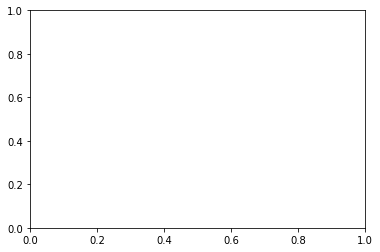

In [103]:
from matplotlib import pyplot as plt
from sklearn import svm



features_names = list(X.columns)
svm = svm.SVC(kernel='linear')
svm.fit(X_train, y_train)


In [142]:
cleanedData.iloc[0:1000]

,fullVisitorId,channelGrouping_(Other),channelGrouping_Affiliates,channelGrouping_Direct,channelGrouping_Display,channelGrouping_Organic Search,channelGrouping_Paid Search,channelGrouping_Referral,channelGrouping_Social,country_(not set),country_Afghanistan,country_Albania,country_Algeria,country_Anguilla,country_Argentina,country_Armenia,country_Australia,country_Austria,country_Azerbaijan,country_Bahrain,country_Bangladesh,country_Belarus,country_Belgium,country_Belize,country_Bermuda,country_Bolivia,country_Bosnia & Herzegovina,country_Brazil,country_Brunei,country_Bulgaria,country_Burkina Faso,country_Cambodia,country_Cameroon,country_Canada,country_Cape Verde,country_Cayman Islands,country_Chad,country_Chile,country_China,country_Colombia,country_Congo - Kinshasa,country_Costa Rica,country_Croatia,country_Curaçao,country_Cyprus,country_Czechia,country_Côte d’Ivoire,country_Denmark,country_Dominican Republic,country_Ecuador,country_Egypt,country_El Salvador,country_Estonia,country_Ethiopia,country_Fiji,country_Finland,country_France,country_Georgia,country_Germany,country_Ghana,country_Gibraltar,country_Greece,country_Grenada,country_Guadeloupe,country_Guatemala,country_Hong Kong,country_Hungary,country_Iceland,country_India,country_Indonesia,country_Iraq,country_Ireland,country_Israel,country_Italy,country_Jamaica,country_Japan,country_Jordan,country_Kazakhstan,country_Kenya,country_Kosovo,country_Kuwait,country_Kyrgyzstan,country_Laos,country_Latvia,country_Lebanon,country_Libya,country_Lithuania,country_Luxembourg,country_Macau,country_Macedonia (FYROM),country_Malaysia,country_Maldives,country_Malta,country_Martinique,country_Mauritania,country_Mauritius,country_Mexico,country_Moldova,country_Mongolia,country_Montenegro,country_Morocco,country_Myanmar (Burma),country_Namibia,country_Nepal,country_Netherlands,country_New Zealand,country_Nicaragua,country_Nigeria,country_Norway,country_Oman,country_Pakistan,country_Palestine,country_Panama,country_Papua New Guinea,country_Paraguay,country_Peru,country_Philippines,country_Poland,country_Portugal,country_Puerto Rico,country_Qatar,country_Romania,country_Russia,country_San Marino,country_Saudi Arabia,country_Senegal,country_Serbia,country_Singapore,country_Slovakia,country_Slovenia,country_Somalia,country_South Africa,country_South Korea,country_Spain,country_Sri Lanka,country_St. Lucia,country_Sudan,country_Sweden,country_Switzerland,country_Syria,country_Taiwan,country_Tanzania,country_Thailand,country_Trinidad & Tobago,country_Tunisia,country_Turkey,country_U.S. Virgin Islands,country_Uganda,country_Ukraine,country_United Arab Emirates,country_United Kingdom,country_United States,country_Uruguay,country_Uzbekistan,country_Venezuela,country_Vietnam,country_Yemen,country_Zambia,country_Zimbabwe,continent_(not set),continent_Africa,continent_Americas,continent_Asia,continent_Europe,continent_Oceania,hasSocialSourceReferral_No,hasSocialSourceReferral_Yes,isInteraction_True,isMobile_False,isMobile_True,operatingSystem_(not set),operatingSystem_Android,operatingSystem_BlackBerry,operatingSystem_Chrome OS,operatingSystem_Firefox OS,operatingSystem_Linux,operatingSystem_Macintosh,operatingSystem_Nintendo Wii,operatingSystem_Samsung,operatingSystem_Windows,operatingSystem_Windows Phone,operatingSystem_iOS,source_(direct),source_(not set),source_Partners,source_amazon.com,source_analytics.google.com,source_ask,source_aulagrado.esic.edu,source_away.vk.com,source_baidu,source_basecamp.com,source_bing,source_blog.golang.org,source_calendar.google.com,source_chat.google.com,source_connect.googleforwork.com,source_cv.il3.ub.edu,source_dealspotr.com,source_dfa,source_docs.google.com,source_duckduckgo.com,source_facebook.com,source_feedly.com,source_gatewaycdi.com,source_google,source_google.co.jp,source_google.co.th,source_google.co.uk,source_google.com,source_google.com.au,source_google.de,source_googleads.g.doubleclick.net,source_gophergala.com,source_groups.google.com,source_h.yandex

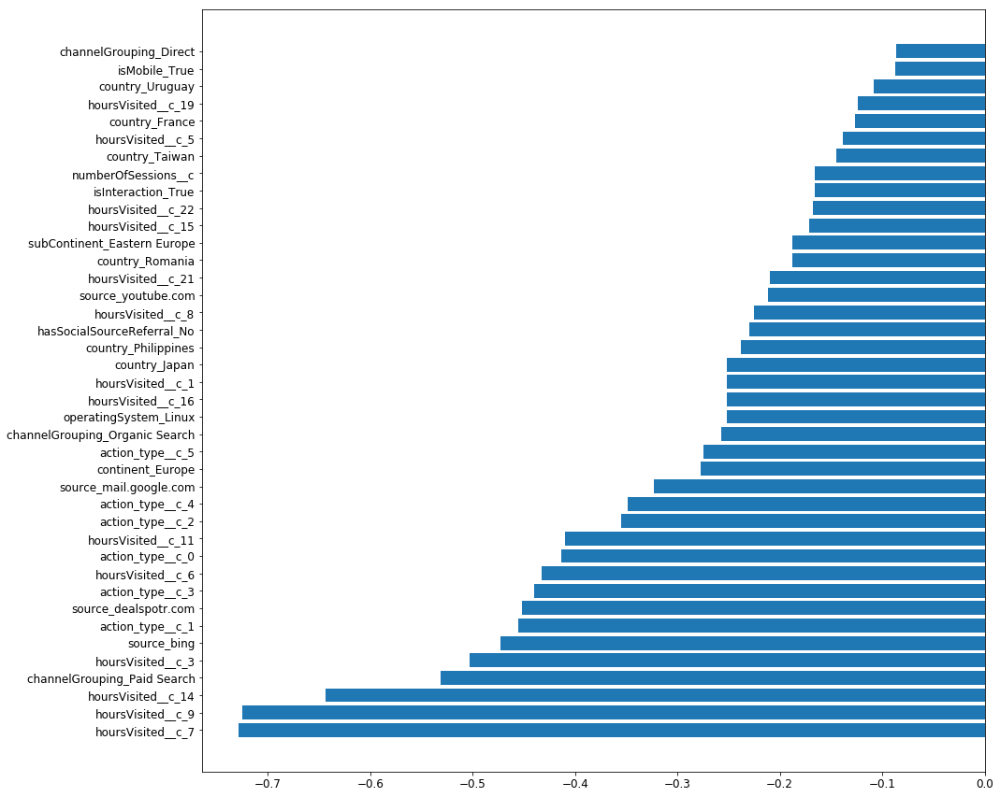

In [141]:
def f_importances(coef, names):
    imp = coef
    imp,names = zip(*sorted(zip(imp,names),reverse = False)[:40])
    fig = plt.figure(figsize=(15,15))
    plt.barh(range(len(names)), imp, align='center')
    plt.yticks(range(len(names)), names)
    plt.show()
f_importances(svm.coef_[0], features_names)

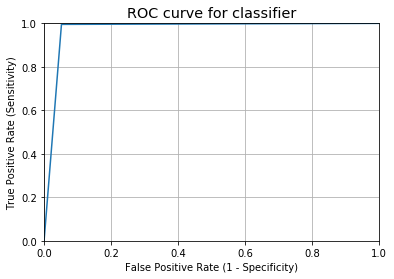

In [121]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, pred_clf)

plt.plot(fpr, tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.rcParams['font.size'] = 12
plt.title('ROC curve for classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.grid(True)

In [120]:
from sklearn import metrics
import pandas as pd
from ggplot import *

preds = clf.predict_proba(X_test)[:,1]
fpr, tpr, _ = metrics.roc_curve(y_test, preds)

df = pd.DataFrame(dict(fpr=fpr, tpr=tpr))
ggplot(df, aes(x='fpr', y='tpr')) +\
 geom_line() +\
 geom_abline(linetype='dashed')

ModuleNotFoundError: No module named 'ggplot'

In [ ]:
auc = metrics.auc(fpr,tpr) #area under curve

In [138]:
from sklearn.tree import DecisionTreeClassifier

clf = tree.DecisionTreeClassifier()
clf = clf.fit(X_train, y_train) 



In [135]:
from sklearn.tree import *
import graphviz
tree.export_graphviz(clf.fit(X_train, y_train)) 
export_graphviz(clf, out_file="mytree.dot")
with open("mytree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)

ExecutableNotFound: failed to execute ['dot', '-Tsvg'], make sure the Graphviz executables are on your systems' PATH

In [140]:
from sklearn.tree import convert_to_graphviz
import graphviz

graphviz.Source(export_graphviz(clf))

ImportError: cannot import name 'convert_to_graphviz' from 'sklearn.tree' (/Users/kuanfeilee/anaconda3/lib/python3.7/site-packages/sklearn/tree/__init__.py)

In [78]:
from sklearn.tree import convert_to_graphviz
convert_to_graphviz(tre)

ImportError: cannot import name 'convert_to_graphviz' from 'sklearn.tree' (/Users/kuanfeilee/anaconda3/lib/python3.7/site-packages/sklearn/tree/__init__.py)

In [ ]:
import xgboost as xgb

In [ ]:

cleanedData['action_type__c_0'] =pd.to_numeric(cleanedData['action_type__c_0'],errors='coerce')
cleanedData['action_type__c_1'] =pd.to_numeric(cleanedData['action_type__c_1'],errors='coerce')
cleanedData['action_type__c_2'] =pd.to_numeric(cleanedData['action_type__c_2'],errors='coerce')
cleanedData['step__c_1'] =pd.to_numeric(cleanedData['step__c_1'],errors='coerce')

# cleanedData[['action_type__c_0','action_type__c_1','action_type__c_0','step__c_1']] =cleanedData[['action_type__c_0','action_type__c_1','action_type__c_0','step__c_1']].astype(int) 
cleanedData.dtypes


In [ ]:
X.iloc[3193:3194]

In [ ]:
X = cleanedData.drop(['label','fullVisitorId'],axis=1)
y = cleanedData['label']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 4)

# Import the model we are using


# instantiate model
xgb_clf = xgb.XGBClassifier()

# fit model with data (training)
xgb_clf.fit(X_train, y_train)

# Use the forest's predict method on the test data
y_pred = xgb_clf.predict(X_test)

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

